In [ ]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore")

In [2]:
adata = sc.read_h5ad('../data/mtDNA_DSB_5k_clustered.h5ad')

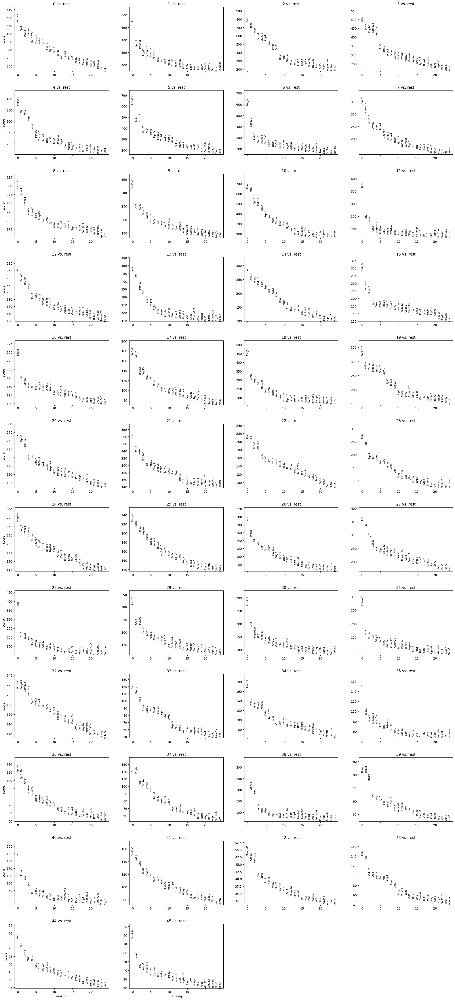

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,Slc1a3,474.107880,2.906861,0.0,0.0
1,0,Gja1,418.784973,3.016683,0.0,0.0
2,0,Plpp3,385.859314,3.069435,0.0,0.0
3,0,Gpr37l1,381.791138,3.026930,0.0,0.0
4,0,Fam107a,348.500488,2.188399,0.0,0.0


In [3]:
# --- Find marker genes per cluster ---
sc.tl.rank_genes_groups(adata, groupby="leiden_2", method="t-test")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

# get a tidy table of top markers
markers = sc.get.rank_genes_groups_df(adata, group=None)
markers.head()

In [4]:
marker_genes = pd.DataFrame({
    group: adata.uns['rank_genes_groups']['names'][group][:20]
    for group in adata.uns['rank_genes_groups']['names'].dtype.names
})


In [5]:
for col in marker_genes.columns: 
    print(col)
    genes = marker_genes[col].tolist()
    print(" ".join(genes))
    print(' ')

0
Slc1a3 Gja1 Plpp3 Gpr37l1 Fam107a Atp1b2 Aldoc Fgfr3 S1pr1 Ttyh1 Ntsr2 Ptprz1 Mt2 Gnao1 Gjb6 Luzp2 Appl2 Acsl6 Cspg5 Msmo1
 
1
Pltp Epas1 Selenop Adgrf5 Slc9a3r2 Abcb1a Slc2a1 B2m Flt1 Itih5 Podxl Cxcl12 Abcg2 Pecam1 H2-D1 Cdh5 Egfl7 Fn1 Eng Esam
 
2
Cnp Ptgds Mbp Sept4 Cldn11 Aplp1 Mal Ermn Car2 Qdpr Mog Stmn4 Mag Bin1 Rnf13 Cryab Ugt8a Gprc5b Slc12a2 Apod
 
3
Gnal Gpr88 Ppp1r1b Camk2b Pde10a Pde1b Rgs9 Ptpn5 Scn4b Camkv Slc32a1 Ywhaz Meis2 Camk4 Baiap2 Eno2 Ppp3r1 Ndrg4 Rap1gap Cyld
 
4
Impact Ahi1 Meg3 Peg3 Gap43 Minar2 Zcchc12 Stxbp1 Ndn Uchl1 Hap1 Prkar1a Disp2 Eno2 Map1b Rasgrf1 Prkaca Stmn2 Grb10 Rab3a
 
5
Slc6a11 Gja1 Atp1b2 Gpr37l1 Ntsr2 Fgfr3 Plpp3 Slc1a3 Ttyh1 Aldoc Ndrg2 Gjb6 Selenop Ptprz1 Ntrk2 Mt2 Ckb Acsl6 Etnppl S1pr1
 
6
Meg3 Snap25 Stxbp1 Cabp1 Atp2b2 Slc17a7 Gria2 Sncb Cyfip2 Dnm1 Camk2b Lingo1 Gabra1 Grin1 Adgrb1 Ppp3r1 Hivep2 Grin2a Syn1 Camk2a
 
7
Snap25 Camk2a Atp2b2 Cyfip2 Cabp1 Stxbp1 Slc17a7 Lingo1 Gabra1 Sncb Ppp3r1 Ywhaz Camk2b Sept5 Syn1 Pak1 Stx1a Dnm1 

In [6]:
from mllmcelltype import annotate_clusters, setup_logging

In [7]:
from dotenv import load_dotenv
import os

load_dotenv()  # will read .env into environment
api_key = os.getenv("../OPENAI_API_KEY")

In [8]:
marker_genes = marker_genes.T

In [9]:
marker_genes = marker_genes.reset_index().rename(columns={'index':'cluster'})

In [10]:
marker_genes = marker_genes.set_index("cluster").T.to_dict("list")

In [11]:
import os

# Annotate clusters with a single model
annotations = annotate_clusters(
    marker_genes=marker_genes,  # DataFrame or dictionary of marker genes
    species='mouse',               # Organism species
    provider='openai',            # LLM provider
    model='gpt-4o-mini',               # Specific model
    tissue='brain'                #Tissue context (optional but recommended)
)

# Print annotations
for cluster, annotation in annotations.items():
    print(f"Cluster {cluster}: {annotation}")

2025-09-23 14:26:18 - llmcelltype - INFO - Logging initialized. Log file: /Users/christoffer/.llmcelltype/logs/llmcelltype_20250923_142618.log
2025-09-23 14:26:18 - llmcelltype - INFO - Starting annotation with provider: openai
2025-09-23 14:26:18 - llmcelltype - INFO - Found 46 clusters
2025-09-23 14:26:18 - llmcelltype - INFO - Creating prompt for 46 clusters
2025-09-23 14:26:18 - llmcelltype - INFO - Generated prompt with 2714 characters
2025-09-23 14:26:18 - llmcelltype - INFO - Processing request with openai using model gpt-4o-mini
2025-09-23 14:26:18 - llmcelltype - INFO - Starting OpenAI API request with model: gpt-4o-mini
2025-09-23 14:26:18 - llmcelltype - INFO - Using model: gpt-4o-mini
2025-09-23 14:26:18 - llmcelltype - INFO - Processing 1 chunks of input
2025-09-23 14:26:18 - llmcelltype - INFO - Processing chunk 1 of 1
2025-09-23 14:26:18 - llmcelltype - INFO - Sending API request...
2025-09-23 14:26:25 - llmcelltype - INFO - Got response with 46 lines
2025-09-23 14:26:25

Cluster 0: Astrocyte
Cluster 1: Oligodendrocyte precursor cell
Cluster 2: Oligodendrocyte
Cluster 3: Medium spiny neuron
Cluster 4: Neuronal progenitor
Cluster 5: Astrocyte
Cluster 6: Neuron
Cluster 7: Neuron
Cluster 8: Excitatory neuron
Cluster 9: Inhibitory neuron
Cluster 10: Oligodendrocyte
Cluster 11: Microglia
Cluster 12: Neuronal progenitor
Cluster 13: Microglia
Cluster 14: Oligodendrocyte
Cluster 15: Neuron
Cluster 16: Endothelial cell
Cluster 17: Neuronal progenitor
Cluster 18: Neuron
Cluster 19: Neuron
Cluster 20: Oligodendrocyte precursor cell
Cluster 21: Neuron
Cluster 22: Astrocyte
Cluster 23: Oligodendrocyte
Cluster 24: Neuron
Cluster 25: Neuron
Cluster 26: Oligodendrocyte
Cluster 27: Endothelial cell
Cluster 28: Ependymal cell
Cluster 29: Neuron
Cluster 30: Neuron
Cluster 31: Neuron
Cluster 32: Neuron
Cluster 33: Oligodendrocyte
Cluster 34: Astrocyte
Cluster 35: Oligodendrocyte precursor cell
Cluster 36: Medium spiny neuron
Cluster 37: Oligodendrocyte
Cluster 38: Oligoden

In [12]:
adata.obs['cell_class'] = adata.obs['leiden_2'].map(annotations)

... storing 'cell_class' as categorical


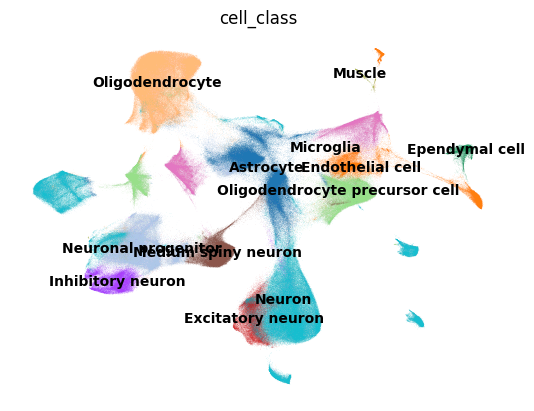

In [13]:
sc.pl.umap(adata, color='cell_class', legend_loc='on data', frameon=False)

In [14]:
spatial = np.array(adata.obs[['x_centroid','y_centroid']])
adata.obsm['spatial'] = spatial

output-XETG00045__0060539__RB4282__20250917__105852


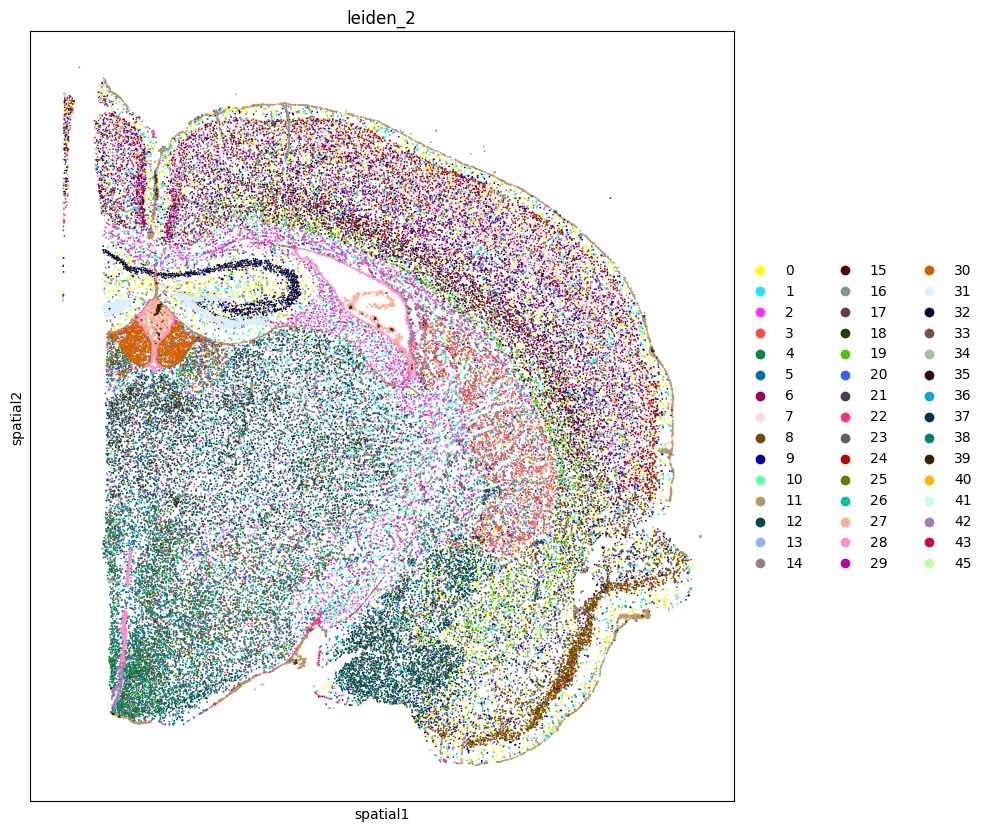

output-XETG00045__0060539__RB4350__20250917__105852


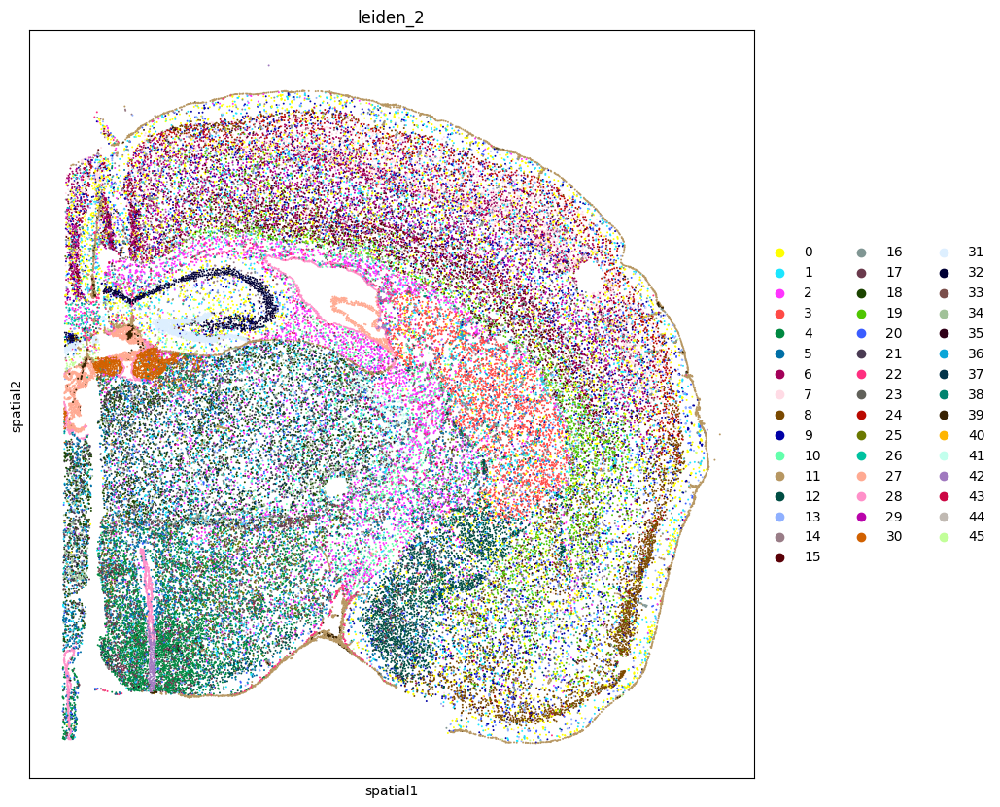

output-XETG00045__0060539__RB4401__20250917__105852


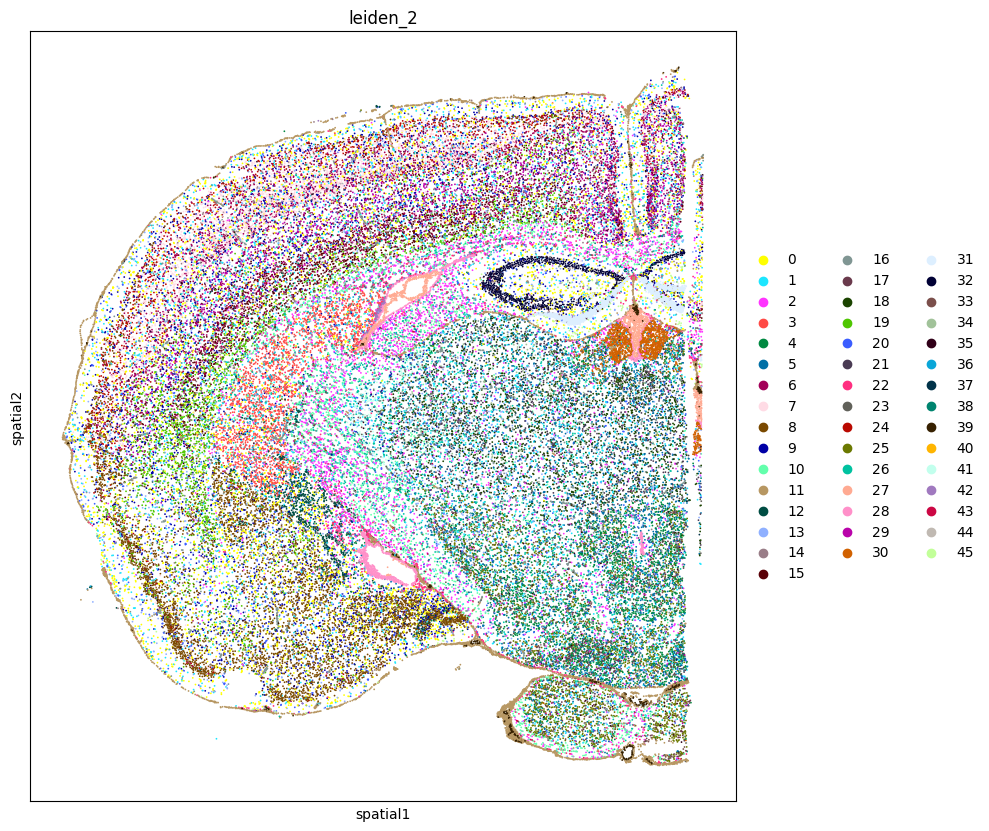

output-XETG00045__0060539__RB4403__20250917__105852


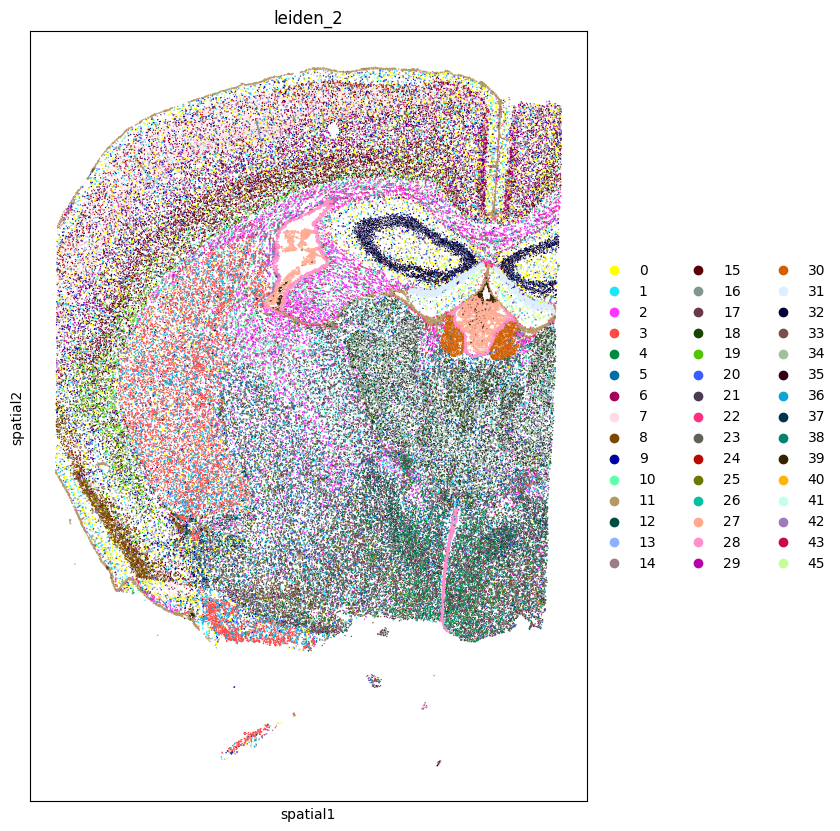

output-XETG00045__0060539__RB4405__20250917__105852


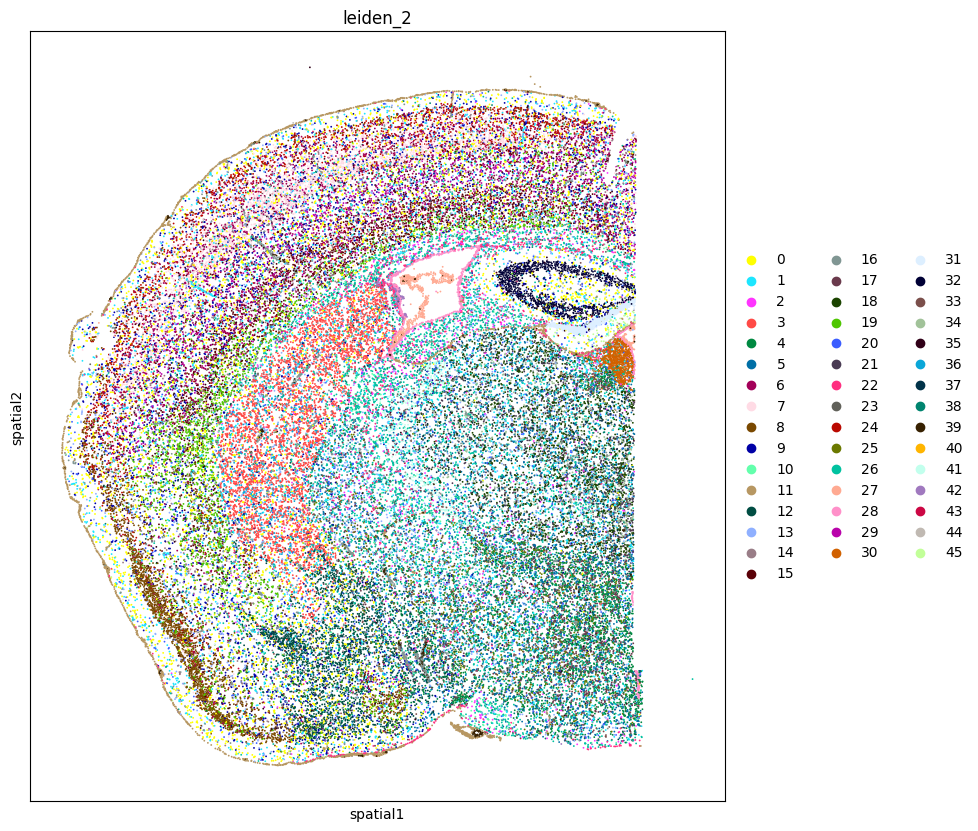

output-XETG00045__0060539__RB4498__20250917__105852


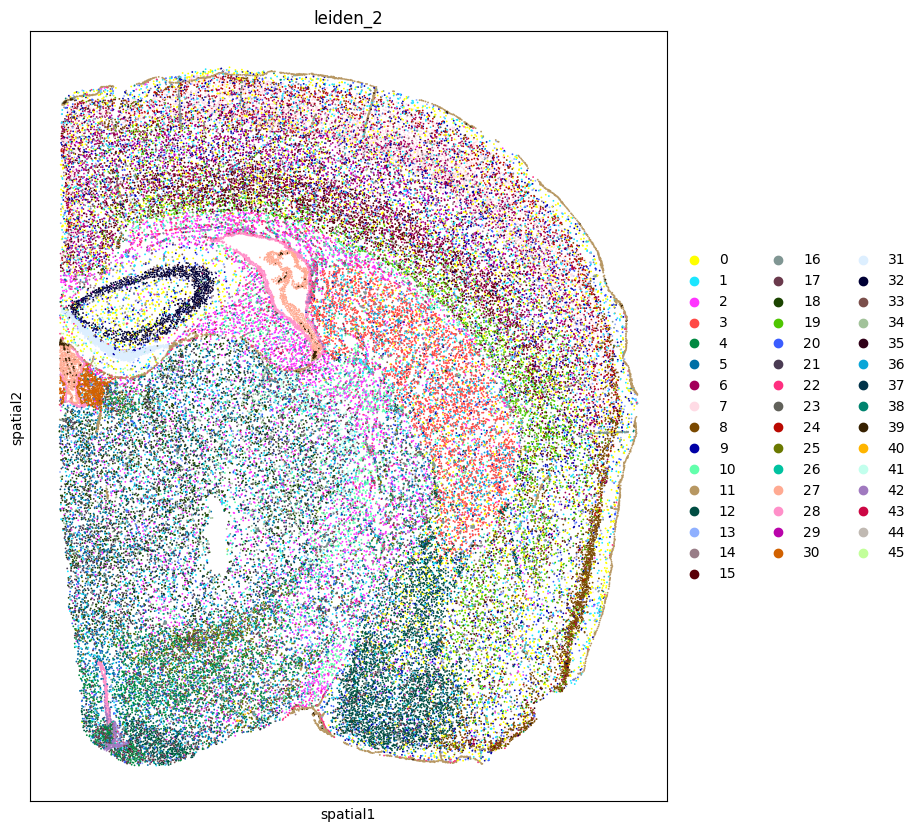

output-XETG00045__0060541__RB4620__20250917__105852


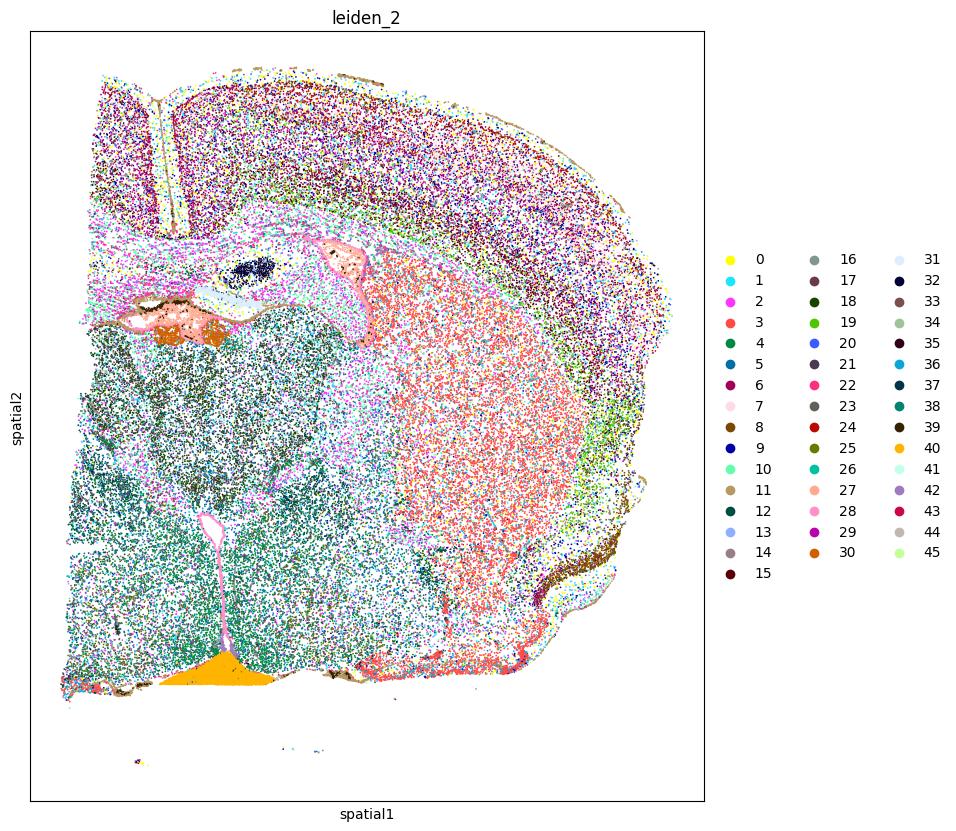

output-XETG00045__0060541__RB4627__20250917__105852


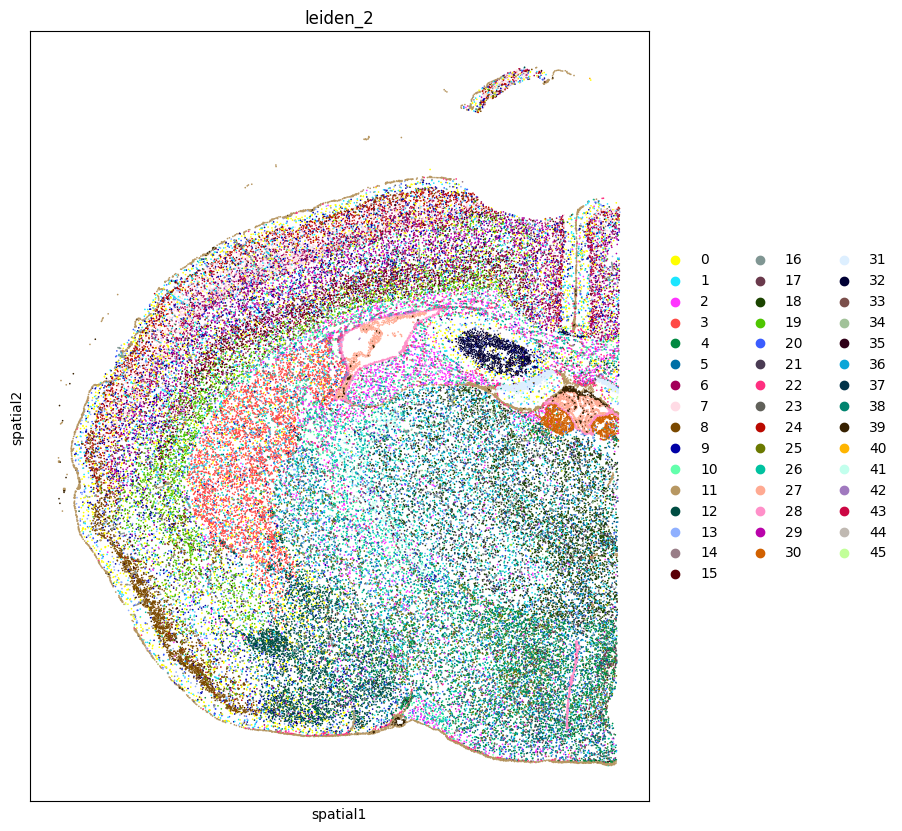

output-XETG00045__0060541__RB4630__20250917__105852


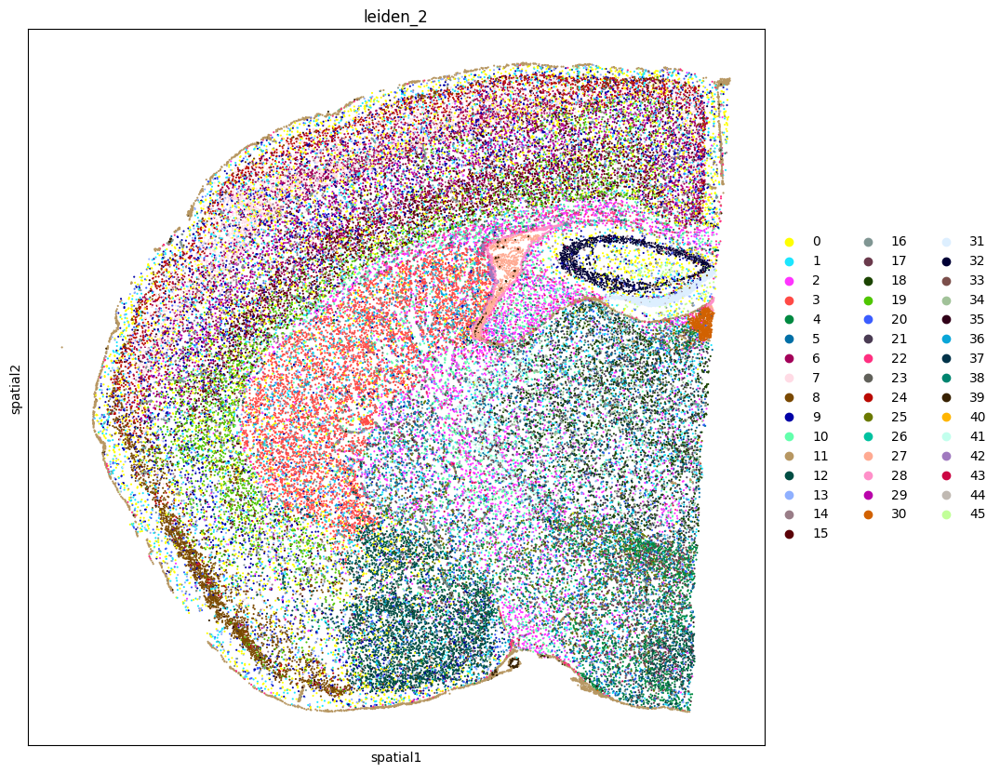

output-XETG00045__0060541__RB4653__20250917__105852


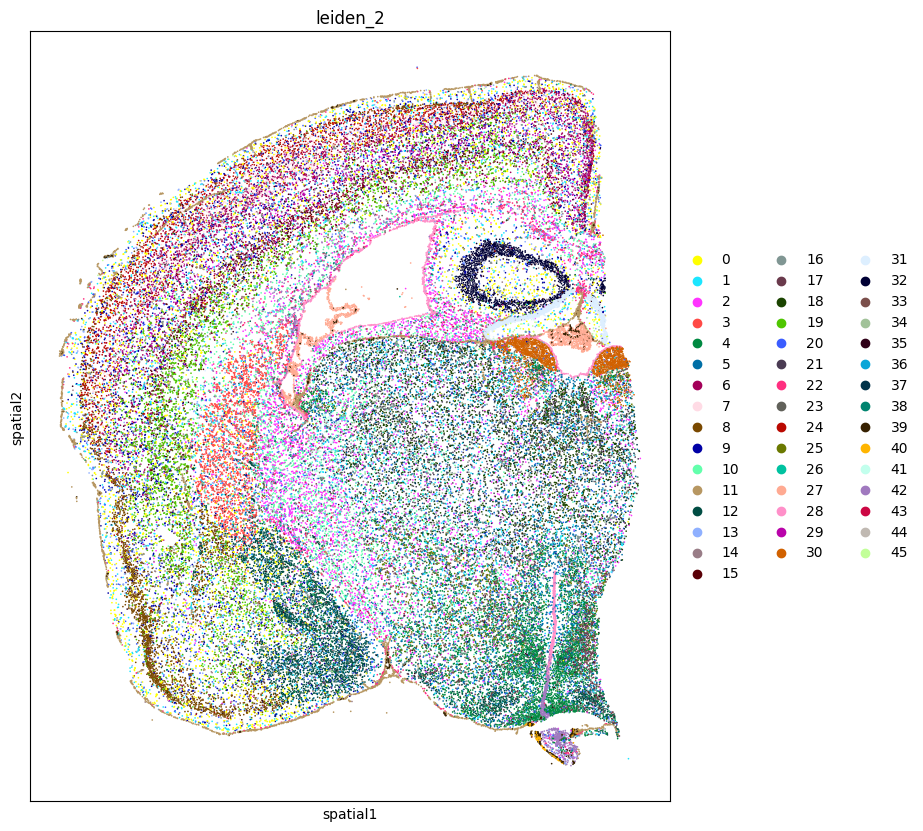

output-XETG00045__0060541__RB4658__20250917__105852


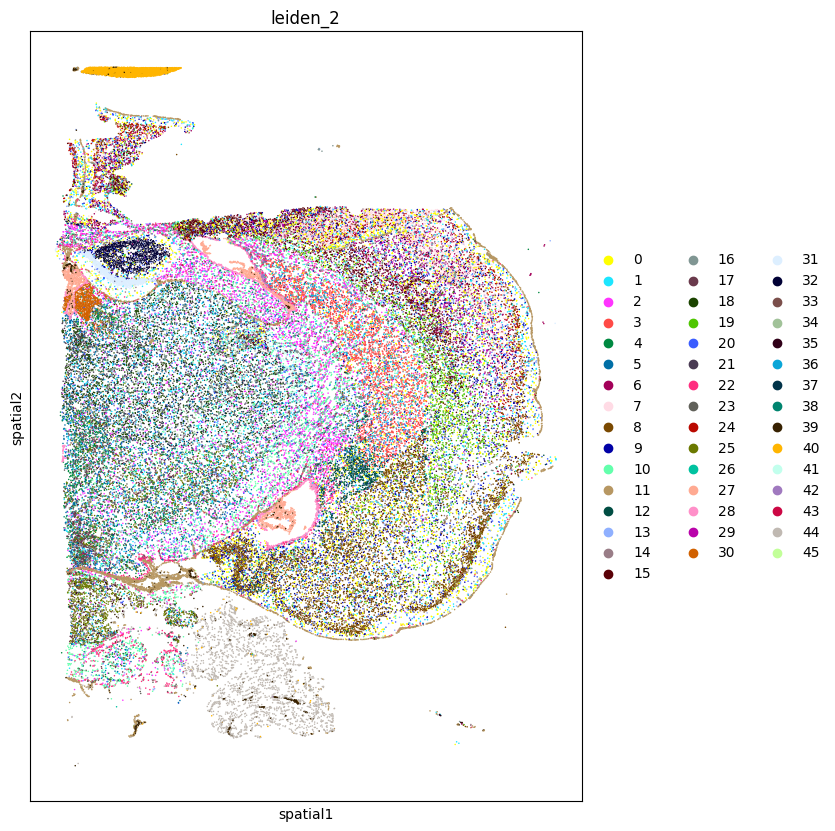

output-XETG00045__0060541__RB4676__20250917__105852


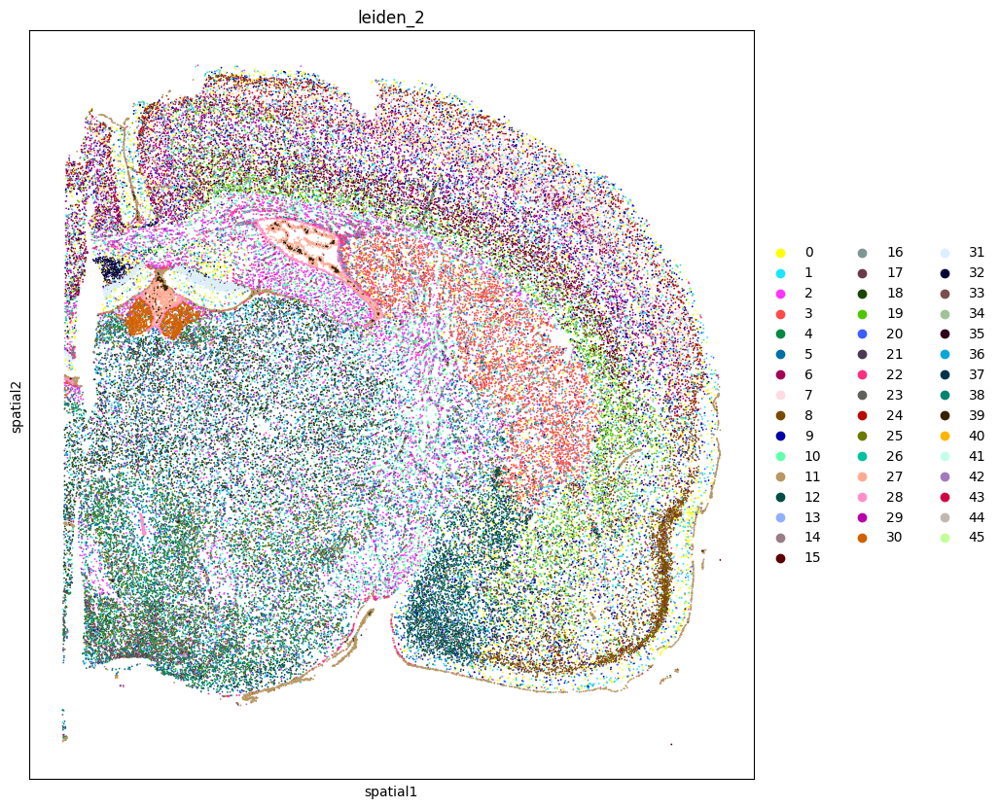

In [22]:
for run in adata.obs['run'].unique():
    print(run)
    ad_int = adata[adata.obs['run'] == run]
    with plt.rc_context({'figure.figsize': (20, 10)}):
        sc.pl.spatial(ad_int, spot_size=15, color = 'leiden_2')
    plt.show()
    

In [30]:
adata.write('../data/mtDNA_DSB_5k_clustered_LLM_anno.h5ad')